In [1]:
import pandas as pd
import numpy as np

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("./data/data.csv")

In [4]:
#Getting the numeric columns from the dataframe
numeric_columns = df.select_dtypes([np.number]).columns

In [5]:
standardised_df = df.copy()

In [ ]:
#Standardization
standardised_df[numeric_columns] = ((standardised_df[numeric_columns] - standardised_df[numeric_columns].mean())/(standardised_df[numeric_columns].std()))

In [12]:
#Normalization
standardised_df[numeric_columns] = ((standardised_df[numeric_columns] - standardised_df[numeric_columns].min())/(standardised_df[numeric_columns].max()-standardised_df[numeric_columns].min()))

In [10]:
#Standard Scalar
from sklearn.preprocessing import StandardScaler
standardised_df[numeric_columns] = StandardScaler().fit_transform(standardised_df[numeric_columns])

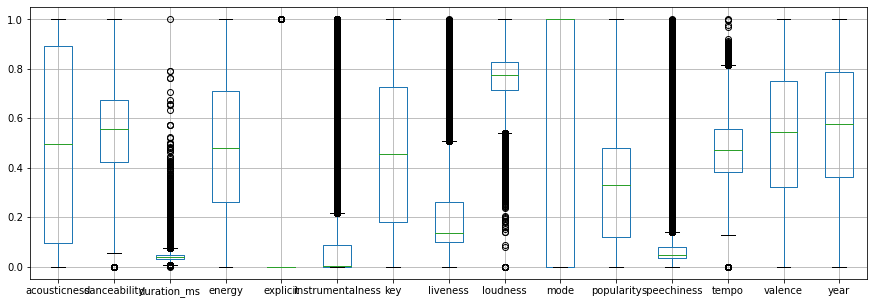

In [13]:
#Box plot after normalizing
standardised_df[numeric_columns].boxplot(figsize = (15,5))

In [14]:
#PCA decomposition
from sklearn.decomposition import PCA
def getPCA(df,numeric_columns):
    pca = PCA(0.95)
    pca.fit(df[numeric_columns])
    test = pca.transform(df[numeric_columns])
    test = pd.DataFrame(data = test)
    return test

In [15]:
#Getting name as the first column
standardised_df = standardised_df[['name'] + [col for col in standardised_df if col!='name']]

In [16]:
from sklearn.metrics.pairwise import cosine_similarity,euclidean_distances
from scipy.spatial.distance import mahalanobis

In [17]:
#Returning Mahalanobis distance vector b/w the the rows in the df and "row" 
def getMahalanobis(df,row):
    covMat = df.cov().to_numpy()
    covMatInv = np.linalg.pinv(covMat)
    l = []
    for i in range(df.shape[0]):
        md = mahalanobis(df.iloc[i].to_numpy(),row.to_numpy(),covMatInv)
        l.append(md)
    return l

In [18]:
#Function to return K-nn using Euclidean metric
def find_nearest_songs(stdf,song,artists,col_list,k,LinkArtist,meta):
    counted_columns = col_list.copy()
    song_position = meta[(meta['name'] == song) & (meta['artists'].str.find(artists)>=0)].index
    song_similarity_set = stdf.copy()
    song_details = song_similarity_set.iloc[song_position]
    song_details['sameArtist'] = LinkArtist
    song_similarity_set['sameArtist'] = np.where(meta['artists'].str.find(artists)>=0,LinkArtist,0)
    song_similarity_set['similarity'] = euclidean_distances(song_similarity_set.copy(),song_details)[:,0] 
    song_similarity_set[['name','artist','id','popularity']] = meta
    song_similarity_set = song_similarity_set[['name'] + [col for col in song_similarity_set if col!='name']]
    song_similarity_set = song_similarity_set.sort_values(['similarity','popularity'], ascending = [True,False])
    similar_songs = song_similarity_set.iloc[:k,:]
    return similar_songs
    

In [34]:
#Function to return K-nn using Mahalanobis metric
def find_nearest_songs_using_mahalanobis(stdf,song,artists,col_list,k,LinkArtist,meta):
    counted_columns = col_list.copy()
    song_position = meta[(meta['name'] == song) & (meta['artists'].str.find(artists)>=0)].index
    song_similarity_set = stdf.copy()
    song_details = song_similarity_set.iloc[song_position]
    song_details['sameArtist'] = LinkArtist
    song_similarity_set['sameArtist'] = np.where(meta['artists'].str.find(artists)>=0,LinkArtist,0)
    song_similarity_set['similarity'] = getMahalanobis(song_similarity_set,song_details)
    song_similarity_set[['name','artist','id','popularity']] = meta
    song_similarity_set = song_similarity_set[['name'] + [col for col in song_similarity_set if col!='name']]
    song_similarity_set = song_similarity_set.sort_values(['similarity','popularity'], ascending = [True,False])
    similar_songs = song_similarity_set.iloc[:k,:]
    return similar_songs

In [20]:
columns_to_use = ['acousticness','danceability','energy','instrumentalness','valence','tempo','mode','liveness','loudness','speechiness','year','key']

In [32]:
#Getting recommendations using Euclidean metric
meta = standardised_df[['name','id','popularity','artists']]
pca_Df = getPCA(standardised_df,numeric_columns)
find_nearest_songs(pca_Df,'Ghostface Killers','Travis Scott',columns_to_use,10,0,meta)

,name,0,1,2,3,4,5,6,7,8,9,sameArtist,similarity,artist,id,popularity
106989,Ghostface Killers,-0.516900,-0.336678,0.418092,0.304782,0.863929,0.167320,-0.240124,0.182132,0.093042,-0.161954,0,0.000000,5u6vkDnOyaf8LsteDAj2ub,0.72,"['21 Savage', 'Offset', 'Metro Boomin', 'Travi..."
135419,90mh,-0.593559,-0.363098,0.521179,0.340624,0.801616,0.154678,-0.170019,0.137990,0.059493,-0.063194,0,0.200677,7nduUhUmzj9IdkvFmdtO7g,0.70,['Trefuego']
86565,Don't Matter,-0.548981,-0.347755,0.383165,0.202376,0.778208,0.232526,-0.201107,0.127046,0.010306,-0.040373,0,0.225039,7I6DceMT3utDOHjcYCbrr4,0.68,['Akon']
15717,Wool (feat. Vince Staples),-0.468469,-0.344055,0.459861,0.138294,0.854841,0.266594,-0.161930,0.190264,0.112625,-0.240188,0,0.233421,228nYWqXzsBS9Ha0SIpM7q,0.55,"['Earl Sweatshirt', 'Vince Staples']"
70225,Lil Baby,-0.449378,-0.334848,0.394555,0.245715,0.802335,0.195058,-0.087846,0.316280,0.015636,-0.103279,0,0.252562,4EBR01Mp4tjpKMYjKNpj2f,0.53,"['Mustard', 'Ty Dolla $ign']"
126164,Relentless,-0.545514,-0.364789,0.581646,0.227121,0.849544,0.199114,-0.312490,0.081297,-0.037688,-0.184139,0,0.261906,1F8yKtk5CQBptos4kM7aO7,0.71,['Polo G']
106759,Blessings,-0.559398,-0.351087,0.510489,0.299330,0.850225,0.193608,-0.206238,0.048430,-0.091757,-0.098250,0,0.262093,1bzM1cd6oqFozdr4wK6HdR,0.66,"['Big Sean', 'Drake']"
23800,I Want (feat. 2 Chainz),-0.654941,-0.355479,0.405717,0.270820,0.772582,0.246631,-0.113382,0.106270,-0.020578,-0.137712,0,0.265830,3zzf7EXJdQ6igozFIefQkX,0.56,"['MadeinTYO', '2 Chainz']"
47655,I Want (feat. 2 Chainz),-0.648967,-0.354688,0.404251,0.266232,0.772715,0.249856,-0.105116,0.102526,-0.023021,-0.139804,0,0.270373,1NMYfyq8eE4qUCj2SXvrJd,0.54,"['MadeinTYO', '2 Chainz']"
87042,Work Out,-0.695167,-0.358818,0.433307,0.349154,0.809282,0.200028,-0.170779,0.018396,0.147380,-0.135951,0,0.271611,2wAJTrFhCnQyNSD3oUgTZO,0.79,['J. Cole']


In [35]:
#Getting Recomendations using mahalanobis metric
meta = standardised_df[['name','id','popularity','artists']]
pca_Df = getPCA(standardised_df,numeric_columns)
find_nearest_songs_using_mahalanobis(pca_Df,'Ghostface Killers','Travis Scott',columns_to_use,10,0,meta)

,name,0,1,2,3,4,5,6,7,8,9,sameArtist,similarity,artist,id,popularity
106989,Ghostface Killers,-0.516900,-0.336678,0.418092,0.304782,0.863929,0.167320,-0.240124,0.182132,0.093042,-0.161954,0,0.000000,5u6vkDnOyaf8LsteDAj2ub,0.72,"['21 Savage', 'Offset', 'Metro Boomin', 'Travi..."
87825,In My Feelings,-0.822913,-0.392685,0.492731,0.247193,0.726412,0.269347,-0.171479,0.185017,0.108792,-0.166382,0,0.963439,2G7V7zsVDxg1yRsu7Ew9RJ,0.81,['Drake']
161281,KOODA,-0.712402,-0.368175,0.504282,0.268464,0.842179,0.260251,-0.165754,0.066745,0.081408,-0.188025,0,0.972626,0tYHqwTW4s6VuPWDSD7n7K,0.70,['6ix9ine']
15717,Wool (feat. Vince Staples),-0.468469,-0.344055,0.459861,0.138294,0.854841,0.266594,-0.161930,0.190264,0.112625,-0.240188,0,1.010680,228nYWqXzsBS9Ha0SIpM7q,0.55,"['Earl Sweatshirt', 'Vince Staples']"
135419,90mh,-0.593559,-0.363098,0.521179,0.340624,0.801616,0.154678,-0.170019,0.137990,0.059493,-0.063194,0,1.020798,7nduUhUmzj9IdkvFmdtO7g,0.70,['Trefuego']
87042,Work Out,-0.695167,-0.358818,0.433307,0.349154,0.809282,0.200028,-0.170779,0.018396,0.147380,-0.135951,0,1.146575,2wAJTrFhCnQyNSD3oUgTZO,0.79,['J. Cole']
40023,The Cut Off (feat. kiLL edward),-0.631748,-0.360705,0.481844,0.199584,0.850211,0.295165,-0.080675,0.147386,0.161346,-0.120100,0,1.161872,3rFF7kSm5qBOOPs6ljFgPp,0.61,"['J. Cole', 'kiLL edward']"
23800,I Want (feat. 2 Chainz),-0.654941,-0.355479,0.405717,0.270820,0.772582,0.246631,-0.113382,0.106270,-0.020578,-0.137712,0,1.185568,3zzf7EXJdQ6igozFIefQkX,0.56,"['MadeinTYO', '2 Chainz']"
47655,I Want (feat. 2 Chainz),-0.648967,-0.354688,0.404251,0.266232,0.772715,0.249856,-0.105116,0.102526,-0.023021,-0.139804,0,1.222404,1NMYfyq8eE4qUCj2SXvrJd,0.54,"['MadeinTYO', '2 Chainz']"
15989,Hit tha Roof,-0.545535,-0.377953,0.535882,0.096600,0.746377,0.250398,-0.264600,0.254258,0.021454,-0.098117,0,1.250668,5LUUJL8EfdmBWNS66wD7B5,0.65,['Speed Gang']


In [36]:
#Time taken for the model to return recommendations
import time
def testTime(df,song,artist,columns_to_use,meta):
    time_euclidean = []
    time_mahalanobis = []
    for i in range(1,10):
        start = time.time()
        find_nearest_songs(df,song,artist,columns_to_use,i,0,meta)
        time_euclidean.append(round(time.time()-start,3))
        start = time.time()
        find_nearest_songs_using_mahalanobis(df,song,artist,columns_to_use,i,0,meta)
        time_mahalanobis.append(round(time.time()-start,3))
    x = [1,2,3,4,5,6,7,8,9]
    plt.plot(x,time_euclidean,label = 'Euclidean')
    plt.plot(x,time_mahalanobis,label = 'Mahalanobis')
    plt.ylabel('Time taken')
    plt.xlabel('K- value')
    plt.title('Time taken for the models')
    plt.legend()
    plt.show()


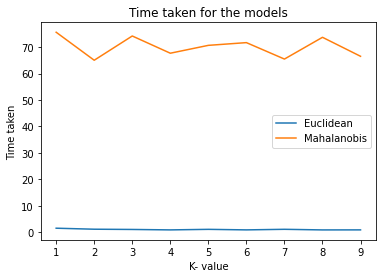

In [27]:
meta = standardised_df[['name','id','popularity','artists']]
pca_Df = getPCA(standardised_df,numeric_columns)
testTime(pca_Df,'Ghostface Killers','Travis Scott',columns_to_use,meta)